<a href="https://colab.research.google.com/github/warninjaden/Neural-Networks-Project/blob/main/noasianGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
project_name = 'noasianGAN'

In [ ]:
!pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/caldodepollo/famous-people-faces'
od.download(dataset_url)

100%|██████████| 4.00M/4.00M [00:00<00:00, 15.7MB/s]

In [ ]:
import os

DATA_DIR = './famous-people-faces'
print(os.listdir(DATA_DIR))

['image']


In [ ]:
print(os.listdir(DATA_DIR+'/image')[:10])

['000461.jpg', '000244.jpg', '139708.jpg', '000317.jpg', '000659.jpg', '000706.jpg', '000488.jpg', '000543.jpg', '000015.jpg', '202554.jpg']


In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


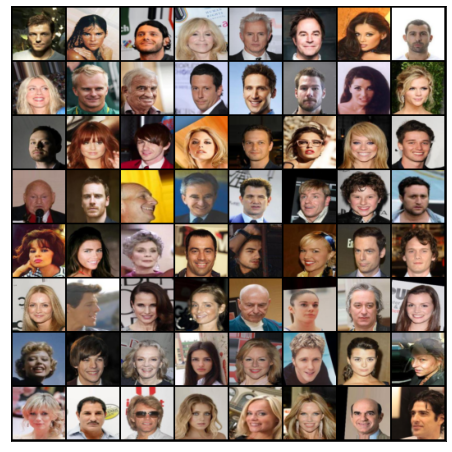

In [ ]:
show_batch(train_dl)

In [ ]:
!pip install jovian --upgrade --quiet

     |████████████████████████████████| 68 kB 2.9 MB/s 


In [ ]:
import jovian

In [ ]:
jovian.commit(project='noasianGAN', environment=None)

[jovian] Detected Colab notebook...


[jovian] Error: jovian.commit doesn't work on Colab unless the notebook was created and executed from Jovian.
Make sure to run the first code cell at the top after executing from Jovian.
Alternatively, you can download this notebook and upload it manually to Jovian.
Learn more: https://jovian.ai/docs/user-guide/run.html#run-on-colab


In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Dropout(p=0.5),
    # out: 64 x 32 x 32


    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Dropout(p=0.5),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Dropout(p=0.5),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


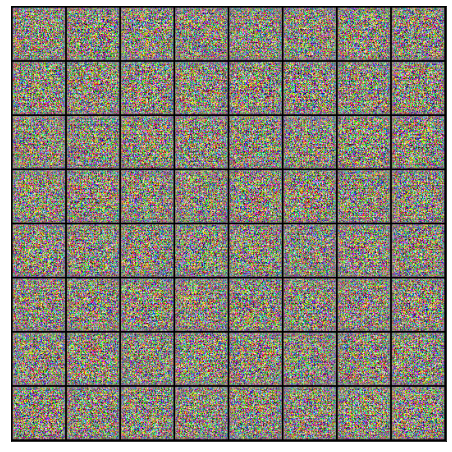

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


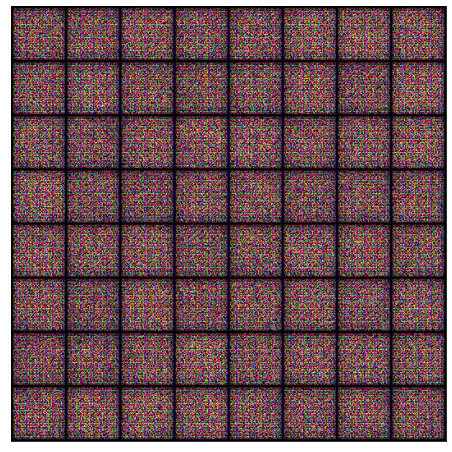

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
jovian.commit(project=project_name, environment=None)

[jovian] Detected Colab notebook...


[jovian] Error: jovian.commit doesn't work on Colab unless the notebook was created and executed from Jovian.
Make sure to run the first code cell at the top after executing from Jovian.
Alternatively, you can download this notebook and upload it manually to Jovian.
Learn more: https://jovian.ai/docs/user-guide/run.html#run-on-colab


In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 200

In [ ]:
jovian.reset()
jovian.log_hyperparams(lr=lr, epochs=epochs)

[jovian] Hyperparams logged.


In [ ]:
history = fit(epochs, lr)

  0%|          | 0/5 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch [1/600], loss_g: 4.6538, loss_d: 0.4206, real_score: 0.8676, fake_score: 0.2005
Saving generated-images-0001.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [2/600], loss_g: 6.5681, loss_d: 0.1207, real_score: 0.9294, fake_score: 0.0312
Saving generated-images-0002.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [3/600], loss_g: 8.2501, loss_d: 0.1702, real_score: 0.9545, fake_score: 0.0998
Saving generated-images-0003.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [4/600], loss_g: 10.4080, loss_d: 0.1204, real_score: 0.9108, fake_score: 0.0007
Saving generated-images-0004.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [5/600], loss_g: 9.7877, loss_d: 0.0572, real_score: 0.9500, fake_score: 0.0001
Saving generated-images-0005.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [6/600], loss_g: 13.9488, loss_d: 0.1153, real_score: 0.9109, fake_score: 0.0000
Saving generated-images-0006.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [7/600], loss_g: 16.6471, loss_d: 0.2320, real_score: 0.8559, fake_score: 0.0000
Saving generated-images-0007.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [8/600], loss_g: 16.5116, loss_d: 0.1134, real_score: 0.9216, fake_score: 0.0000
Saving generated-images-0008.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [9/600], loss_g: 16.4758, loss_d: 1.8705, real_score: 0.9788, fake_score: 0.7942
Saving generated-images-0009.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [10/600], loss_g: 8.6286, loss_d: 0.0286, real_score: 0.9766, fake_score: 0.0002
Saving generated-images-0010.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [11/600], loss_g: 9.1913, loss_d: 0.2139, real_score: 0.8932, fake_score: 0.0656
Saving generated-images-0011.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [12/600], loss_g: 19.8168, loss_d: 0.7498, real_score: 0.6105, fake_score: 0.0000
Saving generated-images-0012.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [13/600], loss_g: 10.7887, loss_d: 0.0163, real_score: 0.9852, fake_score: 0.0000
Saving generated-images-0013.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [14/600], loss_g: 13.1831, loss_d: 0.3072, real_score: 0.9836, fake_score: 0.2443
Saving generated-images-0014.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [15/600], loss_g: 19.5637, loss_d: 0.6442, real_score: 0.6571, fake_score: 0.0000
Saving generated-images-0015.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [16/600], loss_g: 11.8303, loss_d: 0.0187, real_score: 0.9835, fake_score: 0.0000
Saving generated-images-0016.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [17/600], loss_g: 17.9713, loss_d: 0.2184, real_score: 0.8536, fake_score: 0.0000
Saving generated-images-0017.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [18/600], loss_g: 6.0649, loss_d: 0.0244, real_score: 0.9831, fake_score: 0.0062
Saving generated-images-0018.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [19/600], loss_g: 5.9439, loss_d: 0.1103, real_score: 0.9241, fake_score: 0.0075
Saving generated-images-0019.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [20/600], loss_g: 10.9682, loss_d: 0.0566, real_score: 0.9502, fake_score: 0.0001
Saving generated-images-0020.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [21/600], loss_g: 12.7472, loss_d: 0.1674, real_score: 0.8789, fake_score: 0.0000
Saving generated-images-0021.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [22/600], loss_g: 14.6879, loss_d: 0.0988, real_score: 0.9225, fake_score: 0.0001
Saving generated-images-0022.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [23/600], loss_g: 5.7855, loss_d: 0.1316, real_score: 0.9741, fake_score: 0.0936
Saving generated-images-0023.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [24/600], loss_g: 8.7938, loss_d: 0.1838, real_score: 0.9711, fake_score: 0.1346
Saving generated-images-0024.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [25/600], loss_g: 6.1774, loss_d: 0.0895, real_score: 0.9441, fake_score: 0.0237
Saving generated-images-0025.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [26/600], loss_g: 6.6522, loss_d: 0.1382, real_score: 0.9251, fake_score: 0.0452
Saving generated-images-0026.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [27/600], loss_g: 7.2294, loss_d: 0.0802, real_score: 0.9484, fake_score: 0.0150
Saving generated-images-0027.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [28/600], loss_g: 6.5477, loss_d: 0.0772, real_score: 0.9607, fake_score: 0.0326
Saving generated-images-0028.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [29/600], loss_g: 6.6615, loss_d: 0.1062, real_score: 0.9258, fake_score: 0.0008
Saving generated-images-0029.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [30/600], loss_g: 7.6226, loss_d: 0.0433, real_score: 0.9689, fake_score: 0.0094
Saving generated-images-0030.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [31/600], loss_g: 9.3625, loss_d: 0.1512, real_score: 0.9805, fake_score: 0.1152
Saving generated-images-0031.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [32/600], loss_g: 4.9173, loss_d: 0.1767, real_score: 0.8887, fake_score: 0.0088
Saving generated-images-0032.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [33/600], loss_g: 4.7821, loss_d: 0.3122, real_score: 0.9251, fake_score: 0.1871
Saving generated-images-0033.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [34/600], loss_g: 2.4888, loss_d: 2.9530, real_score: 0.1965, fake_score: 0.0005
Saving generated-images-0034.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [35/600], loss_g: 6.2946, loss_d: 0.6810, real_score: 0.9339, fake_score: 0.4201
Saving generated-images-0035.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [36/600], loss_g: 4.2687, loss_d: 0.4357, real_score: 0.8306, fake_score: 0.1914
Saving generated-images-0036.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [37/600], loss_g: 5.5974, loss_d: 2.3902, real_score: 0.1515, fake_score: 0.0014
Saving generated-images-0037.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [38/600], loss_g: 2.7701, loss_d: 0.4965, real_score: 0.7228, fake_score: 0.1148
Saving generated-images-0038.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [39/600], loss_g: 5.7930, loss_d: 1.0095, real_score: 0.8873, fake_score: 0.5599
Saving generated-images-0039.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [40/600], loss_g: 4.0413, loss_d: 0.5965, real_score: 0.8735, fake_score: 0.3500
Saving generated-images-0040.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [41/600], loss_g: 0.8786, loss_d: 1.2159, real_score: 0.3966, fake_score: 0.0318
Saving generated-images-0041.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [42/600], loss_g: 3.0624, loss_d: 0.5103, real_score: 0.8470, fake_score: 0.2481
Saving generated-images-0042.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [43/600], loss_g: 3.3863, loss_d: 0.5971, real_score: 0.7588, fake_score: 0.2441
Saving generated-images-0043.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [44/600], loss_g: 3.2964, loss_d: 1.7044, real_score: 0.2960, fake_score: 0.0060
Saving generated-images-0044.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [45/600], loss_g: 5.7348, loss_d: 1.1221, real_score: 0.8900, fake_score: 0.5871
Saving generated-images-0045.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [46/600], loss_g: 2.2024, loss_d: 0.3505, real_score: 0.7920, fake_score: 0.0862
Saving generated-images-0046.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [47/600], loss_g: 3.1782, loss_d: 0.5260, real_score: 0.6625, fake_score: 0.0555
Saving generated-images-0047.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [48/600], loss_g: 1.6424, loss_d: 0.6727, real_score: 0.5934, fake_score: 0.0593
Saving generated-images-0048.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [49/600], loss_g: 4.9054, loss_d: 0.2355, real_score: 0.8637, fake_score: 0.0706
Saving generated-images-0049.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [50/600], loss_g: 5.0538, loss_d: 0.4940, real_score: 0.8987, fake_score: 0.3057
Saving generated-images-0050.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [51/600], loss_g: 4.9137, loss_d: 0.3731, real_score: 0.9356, fake_score: 0.2433
Saving generated-images-0051.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [52/600], loss_g: 8.4179, loss_d: 1.9038, real_score: 0.9654, fake_score: 0.7925
Saving generated-images-0052.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [53/600], loss_g: 3.1105, loss_d: 0.3264, real_score: 0.7948, fake_score: 0.0618
Saving generated-images-0053.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [54/600], loss_g: 4.1336, loss_d: 0.3636, real_score: 0.9025, fake_score: 0.2123
Saving generated-images-0054.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [55/600], loss_g: 4.5016, loss_d: 0.3255, real_score: 0.9255, fake_score: 0.2019
Saving generated-images-0055.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [56/600], loss_g: 4.2289, loss_d: 0.2687, real_score: 0.8437, fake_score: 0.0735
Saving generated-images-0056.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [57/600], loss_g: 1.5888, loss_d: 0.6667, real_score: 0.5830, fake_score: 0.0264
Saving generated-images-0057.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [58/600], loss_g: 3.8003, loss_d: 0.7367, real_score: 0.5815, fake_score: 0.0580
Saving generated-images-0058.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [59/600], loss_g: 3.9704, loss_d: 0.5339, real_score: 0.8859, fake_score: 0.3145
Saving generated-images-0059.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [60/600], loss_g: 5.4075, loss_d: 0.8814, real_score: 0.9729, fake_score: 0.5484
Saving generated-images-0060.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [61/600], loss_g: 3.5887, loss_d: 0.3453, real_score: 0.7610, fake_score: 0.0444
Saving generated-images-0061.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [62/600], loss_g: 4.0985, loss_d: 0.3275, real_score: 0.9425, fake_score: 0.2214
Saving generated-images-0062.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [63/600], loss_g: 5.1120, loss_d: 0.2550, real_score: 0.8088, fake_score: 0.0150
Saving generated-images-0063.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [64/600], loss_g: 3.8817, loss_d: 0.2333, real_score: 0.8894, fake_score: 0.0920
Saving generated-images-0064.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [65/600], loss_g: 5.8334, loss_d: 3.0495, real_score: 0.1016, fake_score: 0.0013
Saving generated-images-0065.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [66/600], loss_g: 3.6347, loss_d: 0.6239, real_score: 0.8802, fake_score: 0.3464
Saving generated-images-0066.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [67/600], loss_g: 2.9149, loss_d: 0.4461, real_score: 0.8224, fake_score: 0.1987
Saving generated-images-0067.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [68/600], loss_g: 1.9005, loss_d: 0.6663, real_score: 0.6137, fake_score: 0.0638
Saving generated-images-0068.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [69/600], loss_g: 3.4735, loss_d: 0.2435, real_score: 0.8585, fake_score: 0.0697
Saving generated-images-0069.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [70/600], loss_g: 3.2940, loss_d: 0.2537, real_score: 0.8879, fake_score: 0.1151
Saving generated-images-0070.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [71/600], loss_g: 4.2738, loss_d: 0.2646, real_score: 0.9119, fake_score: 0.1476
Saving generated-images-0071.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [72/600], loss_g: 3.5547, loss_d: 0.3156, real_score: 0.8156, fake_score: 0.0799
Saving generated-images-0072.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [73/600], loss_g: 2.4514, loss_d: 1.9563, real_score: 0.2674, fake_score: 0.0018
Saving generated-images-0073.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [74/600], loss_g: 3.0125, loss_d: 0.3039, real_score: 0.8574, fake_score: 0.1173
Saving generated-images-0074.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [75/600], loss_g: 3.2847, loss_d: 0.3336, real_score: 0.8126, fake_score: 0.0883
Saving generated-images-0075.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [76/600], loss_g: 2.4049, loss_d: 0.2898, real_score: 0.9256, fake_score: 0.1681
Saving generated-images-0076.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [77/600], loss_g: 3.9776, loss_d: 0.3363, real_score: 0.8581, fake_score: 0.1495
Saving generated-images-0077.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [78/600], loss_g: 5.0483, loss_d: 0.4005, real_score: 0.9332, fake_score: 0.2627
Saving generated-images-0078.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [79/600], loss_g: 3.5127, loss_d: 0.2771, real_score: 0.8184, fake_score: 0.0520
Saving generated-images-0079.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [80/600], loss_g: 4.6645, loss_d: 0.3212, real_score: 0.9400, fake_score: 0.2165
Saving generated-images-0080.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [81/600], loss_g: 2.2993, loss_d: 0.5910, real_score: 0.6198, fake_score: 0.0161
Saving generated-images-0081.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [82/600], loss_g: 3.3962, loss_d: 0.2115, real_score: 0.9042, fake_score: 0.0957
Saving generated-images-0082.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [83/600], loss_g: 1.7385, loss_d: 0.4086, real_score: 0.7315, fake_score: 0.0415
Saving generated-images-0083.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [84/600], loss_g: 0.9011, loss_d: 1.8177, real_score: 0.2458, fake_score: 0.0119
Saving generated-images-0084.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [85/600], loss_g: 2.4217, loss_d: 0.7694, real_score: 0.5399, fake_score: 0.0456
Saving generated-images-0085.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [86/600], loss_g: 3.1322, loss_d: 0.5744, real_score: 0.7208, fake_score: 0.1723
Saving generated-images-0086.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [87/600], loss_g: 3.1234, loss_d: 0.4843, real_score: 0.9462, fake_score: 0.3134
Saving generated-images-0087.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [88/600], loss_g: 3.5906, loss_d: 0.5658, real_score: 0.8095, fake_score: 0.2582
Saving generated-images-0088.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [89/600], loss_g: 4.7084, loss_d: 0.4026, real_score: 0.9177, fake_score: 0.2555
Saving generated-images-0089.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [90/600], loss_g: 3.6062, loss_d: 0.2899, real_score: 0.8706, fake_score: 0.1239
Saving generated-images-0090.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [91/600], loss_g: 3.5385, loss_d: 0.6369, real_score: 0.9224, fake_score: 0.3593
Saving generated-images-0091.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [92/600], loss_g: 3.8888, loss_d: 0.3852, real_score: 0.8333, fake_score: 0.1611
Saving generated-images-0092.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [93/600], loss_g: 4.7713, loss_d: 0.2497, real_score: 0.9061, fake_score: 0.1285
Saving generated-images-0093.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [94/600], loss_g: 5.6044, loss_d: 0.3230, real_score: 0.9466, fake_score: 0.2178
Saving generated-images-0094.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [95/600], loss_g: 2.6739, loss_d: 1.3739, real_score: 0.3394, fake_score: 0.0037
Saving generated-images-0095.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [96/600], loss_g: 3.6460, loss_d: 0.3163, real_score: 0.8494, fake_score: 0.1208
Saving generated-images-0096.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [97/600], loss_g: 3.1320, loss_d: 0.3013, real_score: 0.8305, fake_score: 0.0918
Saving generated-images-0097.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [98/600], loss_g: 2.3423, loss_d: 0.1126, real_score: 0.9801, fake_score: 0.0846
Saving generated-images-0098.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [99/600], loss_g: 2.7744, loss_d: 0.5247, real_score: 0.6647, fake_score: 0.0422
Saving generated-images-0099.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [100/600], loss_g: 1.2333, loss_d: 1.2142, real_score: 0.3693, fake_score: 0.0157
Saving generated-images-0100.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [101/600], loss_g: 3.2005, loss_d: 0.5030, real_score: 0.6935, fake_score: 0.0652
Saving generated-images-0101.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [102/600], loss_g: 2.4045, loss_d: 0.9998, real_score: 0.4644, fake_score: 0.0167
Saving generated-images-0102.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [103/600], loss_g: 3.1326, loss_d: 0.4312, real_score: 0.7131, fake_score: 0.0456
Saving generated-images-0103.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [104/600], loss_g: 3.7011, loss_d: 0.2633, real_score: 0.8724, fake_score: 0.1062
Saving generated-images-0104.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [105/600], loss_g: 3.6799, loss_d: 0.2600, real_score: 0.9081, fake_score: 0.1411
Saving generated-images-0105.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [106/600], loss_g: 5.6963, loss_d: 1.3386, real_score: 0.3360, fake_score: 0.0008
Saving generated-images-0106.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [107/600], loss_g: 4.8538, loss_d: 0.4615, real_score: 0.9595, fake_score: 0.3079
Saving generated-images-0107.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [108/600], loss_g: 3.3604, loss_d: 0.2147, real_score: 0.8933, fake_score: 0.0865
Saving generated-images-0108.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [109/600], loss_g: 3.6940, loss_d: 0.2274, real_score: 0.8842, fake_score: 0.0866
Saving generated-images-0109.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [110/600], loss_g: 2.4861, loss_d: 0.3985, real_score: 0.7588, fake_score: 0.0808
Saving generated-images-0110.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [111/600], loss_g: 3.3774, loss_d: 0.2107, real_score: 0.8648, fake_score: 0.0453
Saving generated-images-0111.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [112/600], loss_g: 3.8910, loss_d: 0.2383, real_score: 0.9256, fake_score: 0.1366
Saving generated-images-0112.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [113/600], loss_g: 3.9114, loss_d: 2.4794, real_score: 0.1481, fake_score: 0.0011
Saving generated-images-0113.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [114/600], loss_g: 4.5131, loss_d: 0.3694, real_score: 0.8647, fake_score: 0.1629
Saving generated-images-0114.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [115/600], loss_g: 3.4262, loss_d: 0.6383, real_score: 0.6039, fake_score: 0.0248
Saving generated-images-0115.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [116/600], loss_g: 3.7386, loss_d: 0.3248, real_score: 0.8679, fake_score: 0.1543
Saving generated-images-0116.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [117/600], loss_g: 5.0558, loss_d: 1.2457, real_score: 0.3487, fake_score: 0.0019
Saving generated-images-0117.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [118/600], loss_g: 4.2058, loss_d: 0.3932, real_score: 0.9000, fake_score: 0.2248
Saving generated-images-0118.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [119/600], loss_g: 3.6770, loss_d: 0.2751, real_score: 0.8535, fake_score: 0.0969
Saving generated-images-0119.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [120/600], loss_g: 3.7003, loss_d: 0.3252, real_score: 0.8704, fake_score: 0.1495
Saving generated-images-0120.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [121/600], loss_g: 2.8661, loss_d: 0.2552, real_score: 0.8501, fake_score: 0.0757
Saving generated-images-0121.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [122/600], loss_g: 5.2795, loss_d: 0.1233, real_score: 0.9676, fake_score: 0.0832
Saving generated-images-0122.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [123/600], loss_g: 3.1746, loss_d: 0.2400, real_score: 0.8655, fake_score: 0.0741
Saving generated-images-0123.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [124/600], loss_g: 4.6741, loss_d: 0.2278, real_score: 0.8935, fake_score: 0.0968
Saving generated-images-0124.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [125/600], loss_g: 8.1339, loss_d: 0.3410, real_score: 0.9645, fake_score: 0.2390
Saving generated-images-0125.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [126/600], loss_g: 5.1847, loss_d: 2.0821, real_score: 0.9731, fake_score: 0.7835
Saving generated-images-0126.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [127/600], loss_g: 3.4457, loss_d: 0.4762, real_score: 0.7546, fake_score: 0.1266
Saving generated-images-0127.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [128/600], loss_g: 4.7508, loss_d: 0.5685, real_score: 0.8709, fake_score: 0.3110
Saving generated-images-0128.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [129/600], loss_g: 4.3423, loss_d: 0.3325, real_score: 0.8623, fake_score: 0.1530
Saving generated-images-0129.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [130/600], loss_g: 5.5852, loss_d: 0.4262, real_score: 0.8514, fake_score: 0.2092
Saving generated-images-0130.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [131/600], loss_g: 8.5756, loss_d: 0.5726, real_score: 0.9815, fake_score: 0.3736
Saving generated-images-0131.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [132/600], loss_g: 5.6889, loss_d: 0.2183, real_score: 0.9539, fake_score: 0.1454
Saving generated-images-0132.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [133/600], loss_g: 6.7563, loss_d: 1.3575, real_score: 0.3247, fake_score: 0.0006
Saving generated-images-0133.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [134/600], loss_g: 8.4434, loss_d: 0.8490, real_score: 0.9809, fake_score: 0.5251
Saving generated-images-0134.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [135/600], loss_g: 4.8082, loss_d: 0.4171, real_score: 0.9542, fake_score: 0.2794
Saving generated-images-0135.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [136/600], loss_g: 3.2094, loss_d: 0.4298, real_score: 0.7525, fake_score: 0.0997
Saving generated-images-0136.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [137/600], loss_g: 2.7974, loss_d: 0.3902, real_score: 0.7354, fake_score: 0.0438
Saving generated-images-0137.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [138/600], loss_g: 7.5895, loss_d: 0.7839, real_score: 0.9556, fake_score: 0.4747
Saving generated-images-0138.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [139/600], loss_g: 3.5303, loss_d: 0.2408, real_score: 0.8677, fake_score: 0.0793
Saving generated-images-0139.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [140/600], loss_g: 1.7527, loss_d: 0.8650, real_score: 0.4953, fake_score: 0.0103
Saving generated-images-0140.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [141/600], loss_g: 4.1065, loss_d: 0.2281, real_score: 0.8724, fake_score: 0.0739
Saving generated-images-0141.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [142/600], loss_g: 4.6218, loss_d: 0.2776, real_score: 0.9124, fake_score: 0.1555
Saving generated-images-0142.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [143/600], loss_g: 4.2127, loss_d: 0.2079, real_score: 0.8898, fake_score: 0.0772
Saving generated-images-0143.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [144/600], loss_g: 4.3956, loss_d: 0.2202, real_score: 0.9107, fake_score: 0.1119
Saving generated-images-0144.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [145/600], loss_g: 4.0217, loss_d: 0.1846, real_score: 0.9179, fake_score: 0.0878
Saving generated-images-0145.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [146/600], loss_g: 1.6098, loss_d: 0.3595, real_score: 0.7472, fake_score: 0.0371
Saving generated-images-0146.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [147/600], loss_g: 1.7132, loss_d: 1.1403, real_score: 0.4405, fake_score: 0.0218
Saving generated-images-0147.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [148/600], loss_g: 4.5064, loss_d: 0.3674, real_score: 0.8453, fake_score: 0.1492
Saving generated-images-0148.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [149/600], loss_g: 4.0536, loss_d: 0.2633, real_score: 0.8900, fake_score: 0.1232
Saving generated-images-0149.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [150/600], loss_g: 10.8464, loss_d: 1.9407, real_score: 0.9917, fake_score: 0.8059
Saving generated-images-0150.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [151/600], loss_g: 2.5840, loss_d: 0.4309, real_score: 0.7245, fake_score: 0.0387
Saving generated-images-0151.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [152/600], loss_g: 3.8867, loss_d: 0.3657, real_score: 0.7471, fake_score: 0.0400
Saving generated-images-0152.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [153/600], loss_g: 5.1366, loss_d: 0.4350, real_score: 0.9772, fake_score: 0.3103
Saving generated-images-0153.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [154/600], loss_g: 4.4182, loss_d: 0.3426, real_score: 0.8676, fake_score: 0.1605
Saving generated-images-0154.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [155/600], loss_g: 3.7009, loss_d: 0.2070, real_score: 0.8977, fake_score: 0.0864
Saving generated-images-0155.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [156/600], loss_g: 5.7952, loss_d: 1.7608, real_score: 0.2923, fake_score: 0.0003
Saving generated-images-0156.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [157/600], loss_g: 6.7277, loss_d: 0.4982, real_score: 0.9885, fake_score: 0.3516
Saving generated-images-0157.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [158/600], loss_g: 3.6015, loss_d: 0.2800, real_score: 0.8781, fake_score: 0.1183
Saving generated-images-0158.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [159/600], loss_g: 10.4360, loss_d: 1.4608, real_score: 0.9901, fake_score: 0.6998
Saving generated-images-0159.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [160/600], loss_g: 6.0217, loss_d: 1.3182, real_score: 0.9858, fake_score: 0.6467
Saving generated-images-0160.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [161/600], loss_g: 3.9007, loss_d: 0.3503, real_score: 0.7816, fake_score: 0.0620
Saving generated-images-0161.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [162/600], loss_g: 3.5138, loss_d: 0.4835, real_score: 0.7837, fake_score: 0.1701
Saving generated-images-0162.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [163/600], loss_g: 4.0396, loss_d: 0.3361, real_score: 0.9452, fake_score: 0.2148
Saving generated-images-0163.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [164/600], loss_g: 2.6970, loss_d: 0.4086, real_score: 0.7451, fake_score: 0.0630
Saving generated-images-0164.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [165/600], loss_g: 3.6928, loss_d: 0.4821, real_score: 0.6845, fake_score: 0.0204
Saving generated-images-0165.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [166/600], loss_g: 4.5404, loss_d: 0.2180, real_score: 0.9202, fake_score: 0.1191
Saving generated-images-0166.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [167/600], loss_g: 4.6216, loss_d: 0.2105, real_score: 0.9176, fake_score: 0.1074
Saving generated-images-0167.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [168/600], loss_g: 6.0666, loss_d: 0.0992, real_score: 0.9233, fake_score: 0.0159
Saving generated-images-0168.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [169/600], loss_g: 3.5595, loss_d: 0.2824, real_score: 0.8733, fake_score: 0.1216
Saving generated-images-0169.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [170/600], loss_g: 4.7469, loss_d: 0.1675, real_score: 0.9212, fake_score: 0.0748
Saving generated-images-0170.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [171/600], loss_g: 4.3794, loss_d: 0.1351, real_score: 0.9714, fake_score: 0.0968
Saving generated-images-0171.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [172/600], loss_g: 4.5736, loss_d: 0.0719, real_score: 0.9894, fake_score: 0.0583
Saving generated-images-0172.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [173/600], loss_g: 5.2663, loss_d: 0.2366, real_score: 0.9028, fake_score: 0.1149
Saving generated-images-0173.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [174/600], loss_g: 5.2074, loss_d: 0.1069, real_score: 0.9324, fake_score: 0.0328
Saving generated-images-0174.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [175/600], loss_g: 4.1515, loss_d: 0.1959, real_score: 0.8771, fake_score: 0.0499
Saving generated-images-0175.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [176/600], loss_g: 0.3752, loss_d: 1.2551, real_score: 0.3646, fake_score: 0.0071
Saving generated-images-0176.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [177/600], loss_g: 4.8266, loss_d: 0.7330, real_score: 0.6268, fake_score: 0.0366
Saving generated-images-0177.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [178/600], loss_g: 1.8204, loss_d: 1.3828, real_score: 0.3586, fake_score: 0.0256
Saving generated-images-0178.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [179/600], loss_g: 3.6800, loss_d: 0.3241, real_score: 0.8149, fake_score: 0.0851
Saving generated-images-0179.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [180/600], loss_g: 2.6384, loss_d: 0.5254, real_score: 0.7021, fake_score: 0.1043
Saving generated-images-0180.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [181/600], loss_g: 3.9812, loss_d: 0.2343, real_score: 0.8561, fake_score: 0.0592
Saving generated-images-0181.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [182/600], loss_g: 3.7348, loss_d: 0.2587, real_score: 0.8513, fake_score: 0.0723
Saving generated-images-0182.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [183/600], loss_g: 3.3431, loss_d: 0.3597, real_score: 0.7697, fake_score: 0.0630
Saving generated-images-0183.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [184/600], loss_g: 3.3198, loss_d: 0.2051, real_score: 0.8719, fake_score: 0.0567
Saving generated-images-0184.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [185/600], loss_g: 3.5199, loss_d: 2.7657, real_score: 0.1050, fake_score: 0.0003
Saving generated-images-0185.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [186/600], loss_g: 4.4117, loss_d: 0.9325, real_score: 0.4944, fake_score: 0.0098
Saving generated-images-0186.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [187/600], loss_g: 7.1617, loss_d: 1.0294, real_score: 0.9797, fake_score: 0.5798
Saving generated-images-0187.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [188/600], loss_g: 3.1829, loss_d: 0.4435, real_score: 0.7153, fake_score: 0.0412
Saving generated-images-0188.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [189/600], loss_g: 3.9909, loss_d: 0.8888, real_score: 0.4936, fake_score: 0.0055
Saving generated-images-0189.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [190/600], loss_g: 5.5754, loss_d: 0.3812, real_score: 0.9217, fake_score: 0.2408
Saving generated-images-0190.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [191/600], loss_g: 4.3813, loss_d: 0.2359, real_score: 0.8299, fake_score: 0.0301
Saving generated-images-0191.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [192/600], loss_g: 3.5597, loss_d: 0.2775, real_score: 0.8085, fake_score: 0.0445
Saving generated-images-0192.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [193/600], loss_g: 2.2083, loss_d: 0.3856, real_score: 0.7656, fake_score: 0.0881
Saving generated-images-0193.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [194/600], loss_g: 5.6683, loss_d: 0.4409, real_score: 0.9714, fake_score: 0.3061
Saving generated-images-0194.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [195/600], loss_g: 3.7948, loss_d: 0.2507, real_score: 0.8751, fake_score: 0.0983
Saving generated-images-0195.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [196/600], loss_g: 4.3339, loss_d: 0.4049, real_score: 0.9154, fake_score: 0.2480
Saving generated-images-0196.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [197/600], loss_g: 1.7780, loss_d: 0.3557, real_score: 0.7630, fake_score: 0.0504
Saving generated-images-0197.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [198/600], loss_g: 3.5745, loss_d: 0.3186, real_score: 0.8338, fake_score: 0.1083
Saving generated-images-0198.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [199/600], loss_g: 3.8504, loss_d: 0.2567, real_score: 0.8646, fake_score: 0.0966
Saving generated-images-0199.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [200/600], loss_g: 5.2096, loss_d: 0.5032, real_score: 0.9866, fake_score: 0.3422
Saving generated-images-0200.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [201/600], loss_g: 5.9207, loss_d: 0.4985, real_score: 0.9555, fake_score: 0.3323
Saving generated-images-0201.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [202/600], loss_g: 5.5598, loss_d: 0.3282, real_score: 0.9559, fake_score: 0.2320
Saving generated-images-0202.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [203/600], loss_g: 3.5753, loss_d: 0.2845, real_score: 0.8732, fake_score: 0.1233
Saving generated-images-0203.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [204/600], loss_g: 3.5384, loss_d: 0.2554, real_score: 0.8988, fake_score: 0.1244
Saving generated-images-0204.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [205/600], loss_g: 3.6911, loss_d: 0.1433, real_score: 0.9361, fake_score: 0.0690
Saving generated-images-0205.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [206/600], loss_g: 4.2294, loss_d: 0.1393, real_score: 0.9425, fake_score: 0.0725
Saving generated-images-0206.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [207/600], loss_g: 3.8904, loss_d: 0.1185, real_score: 0.9643, fake_score: 0.0762
Saving generated-images-0207.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [208/600], loss_g: 3.6293, loss_d: 0.1373, real_score: 0.9481, fake_score: 0.0755
Saving generated-images-0208.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [209/600], loss_g: 5.2045, loss_d: 5.4850, real_score: 0.0111, fake_score: 0.0001
Saving generated-images-0209.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [210/600], loss_g: 3.2509, loss_d: 0.7032, real_score: 0.8636, fake_score: 0.3800
Saving generated-images-0210.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [211/600], loss_g: 3.0050, loss_d: 0.5850, real_score: 0.7909, fake_score: 0.2533
Saving generated-images-0211.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [212/600], loss_g: 5.2719, loss_d: 0.7482, real_score: 0.9456, fake_score: 0.4419
Saving generated-images-0212.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [213/600], loss_g: 5.1772, loss_d: 0.8690, real_score: 0.8664, fake_score: 0.4621
Saving generated-images-0213.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [214/600], loss_g: 3.9466, loss_d: 0.3216, real_score: 0.8664, fake_score: 0.1472
Saving generated-images-0214.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [215/600], loss_g: 6.5118, loss_d: 0.7578, real_score: 0.9715, fake_score: 0.4767
Saving generated-images-0215.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [216/600], loss_g: 2.3730, loss_d: 0.4263, real_score: 0.7948, fake_score: 0.1488
Saving generated-images-0216.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [217/600], loss_g: 3.4714, loss_d: 0.2514, real_score: 0.8890, fake_score: 0.1135
Saving generated-images-0217.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [218/600], loss_g: 2.5972, loss_d: 0.3256, real_score: 0.7997, fake_score: 0.0775
Saving generated-images-0218.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [219/600], loss_g: 3.2317, loss_d: 0.2648, real_score: 0.8684, fake_score: 0.1035
Saving generated-images-0219.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [220/600], loss_g: 3.0928, loss_d: 0.3140, real_score: 0.8668, fake_score: 0.1411
Saving generated-images-0220.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [221/600], loss_g: 3.7816, loss_d: 0.2813, real_score: 0.8817, fake_score: 0.1328
Saving generated-images-0221.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [222/600], loss_g: 4.1865, loss_d: 0.2256, real_score: 0.9249, fake_score: 0.1294
Saving generated-images-0222.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [223/600], loss_g: 0.6563, loss_d: 2.2966, real_score: 0.1418, fake_score: 0.0011
Saving generated-images-0223.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [224/600], loss_g: 1.8128, loss_d: 0.8168, real_score: 0.5150, fake_score: 0.0144
Saving generated-images-0224.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [225/600], loss_g: 2.9688, loss_d: 0.4246, real_score: 0.8037, fake_score: 0.1524
Saving generated-images-0225.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [226/600], loss_g: 2.2223, loss_d: 0.7533, real_score: 0.5491, fake_score: 0.0202
Saving generated-images-0226.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [227/600], loss_g: 4.3686, loss_d: 0.2801, real_score: 0.8252, fake_score: 0.0637
Saving generated-images-0227.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [228/600], loss_g: 3.8601, loss_d: 0.4245, real_score: 0.7035, fake_score: 0.0244
Saving generated-images-0228.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [229/600], loss_g: 3.9414, loss_d: 0.2569, real_score: 0.8641, fake_score: 0.0896
Saving generated-images-0229.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [230/600], loss_g: 4.0841, loss_d: 0.2507, real_score: 0.8247, fake_score: 0.0406
Saving generated-images-0230.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [231/600], loss_g: 3.5372, loss_d: 0.2661, real_score: 0.8016, fake_score: 0.0247
Saving generated-images-0231.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [232/600], loss_g: 2.3310, loss_d: 0.2565, real_score: 0.8478, fake_score: 0.0785
Saving generated-images-0232.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [233/600], loss_g: 3.8563, loss_d: 0.1812, real_score: 0.9112, fake_score: 0.0769
Saving generated-images-0233.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [234/600], loss_g: 2.3309, loss_d: 0.3319, real_score: 0.7625, fake_score: 0.0211
Saving generated-images-0234.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [235/600], loss_g: 3.8406, loss_d: 0.1979, real_score: 0.9677, fake_score: 0.1437
Saving generated-images-0235.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [236/600], loss_g: 3.2065, loss_d: 0.2370, real_score: 0.8722, fake_score: 0.0870
Saving generated-images-0236.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [237/600], loss_g: 10.6275, loss_d: 1.3836, real_score: 0.9969, fake_score: 0.6771
Saving generated-images-0237.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [238/600], loss_g: 4.5423, loss_d: 0.6135, real_score: 0.8820, fake_score: 0.3296
Saving generated-images-0238.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [239/600], loss_g: 3.6540, loss_d: 0.3389, real_score: 0.7752, fake_score: 0.0523
Saving generated-images-0239.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [240/600], loss_g: 2.1917, loss_d: 0.4333, real_score: 0.7193, fake_score: 0.0641
Saving generated-images-0240.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [241/600], loss_g: 3.6733, loss_d: 0.1749, real_score: 0.9023, fake_score: 0.0626
Saving generated-images-0241.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [242/600], loss_g: 5.0700, loss_d: 0.3758, real_score: 0.9000, fake_score: 0.2116
Saving generated-images-0242.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [243/600], loss_g: 2.9218, loss_d: 0.2700, real_score: 0.8177, fake_score: 0.0510
Saving generated-images-0243.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [244/600], loss_g: 3.3203, loss_d: 0.1886, real_score: 0.8996, fake_score: 0.0730
Saving generated-images-0244.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [245/600], loss_g: 3.8961, loss_d: 0.1812, real_score: 0.8844, fake_score: 0.0506
Saving generated-images-0245.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [246/600], loss_g: 4.5711, loss_d: 0.2392, real_score: 0.9538, fake_score: 0.1634
Saving generated-images-0246.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [247/600], loss_g: 3.6343, loss_d: 0.1351, real_score: 0.9550, fake_score: 0.0814
Saving generated-images-0247.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [248/600], loss_g: 6.5338, loss_d: 0.3275, real_score: 0.9788, fake_score: 0.2429
Saving generated-images-0248.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [249/600], loss_g: 4.3864, loss_d: 0.1291, real_score: 0.9628, fake_score: 0.0834
Saving generated-images-0249.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [250/600], loss_g: 10.8773, loss_d: 0.9495, real_score: 0.9857, fake_score: 0.5500
Saving generated-images-0250.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [251/600], loss_g: 4.1065, loss_d: 0.3273, real_score: 0.8258, fake_score: 0.0698
Saving generated-images-0251.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [252/600], loss_g: 3.6053, loss_d: 0.3162, real_score: 0.8449, fake_score: 0.1206
Saving generated-images-0252.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [253/600], loss_g: 5.7449, loss_d: 0.4699, real_score: 0.9062, fake_score: 0.2773
Saving generated-images-0253.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [254/600], loss_g: 5.6379, loss_d: 0.2604, real_score: 0.9505, fake_score: 0.1754
Saving generated-images-0254.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [255/600], loss_g: 2.1418, loss_d: 1.1832, real_score: 0.3741, fake_score: 0.0022
Saving generated-images-0255.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [256/600], loss_g: 3.8149, loss_d: 0.3293, real_score: 0.8155, fake_score: 0.0880
Saving generated-images-0256.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [257/600], loss_g: 3.1824, loss_d: 0.2681, real_score: 0.8491, fake_score: 0.0836
Saving generated-images-0257.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [258/600], loss_g: 4.3784, loss_d: 0.2513, real_score: 0.9430, fake_score: 0.1640
Saving generated-images-0258.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [259/600], loss_g: 4.0082, loss_d: 0.2069, real_score: 0.9384, fake_score: 0.1251
Saving generated-images-0259.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [260/600], loss_g: 3.9300, loss_d: 0.2092, real_score: 0.9503, fake_score: 0.1375
Saving generated-images-0260.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [261/600], loss_g: 3.9904, loss_d: 0.2118, real_score: 0.9416, fake_score: 0.1325
Saving generated-images-0261.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [262/600], loss_g: 3.5891, loss_d: 0.1680, real_score: 0.9371, fake_score: 0.0899
Saving generated-images-0262.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [263/600], loss_g: 3.5279, loss_d: 0.1353, real_score: 0.9261, fake_score: 0.0543
Saving generated-images-0263.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [264/600], loss_g: 3.5268, loss_d: 0.1639, real_score: 0.9539, fake_score: 0.1033
Saving generated-images-0264.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [265/600], loss_g: 2.6569, loss_d: 0.2702, real_score: 0.7948, fake_score: 0.0235
Saving generated-images-0265.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [266/600], loss_g: 9.0463, loss_d: 0.9266, real_score: 0.9937, fake_score: 0.5337
Saving generated-images-0266.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [267/600], loss_g: 3.8180, loss_d: 0.2825, real_score: 0.9534, fake_score: 0.1908
Saving generated-images-0267.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [268/600], loss_g: 4.0578, loss_d: 0.3465, real_score: 0.8781, fake_score: 0.1750
Saving generated-images-0268.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [269/600], loss_g: 8.3215, loss_d: 0.6653, real_score: 0.9856, fake_score: 0.4354
Saving generated-images-0269.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [270/600], loss_g: 6.4189, loss_d: 0.4703, real_score: 0.9715, fake_score: 0.3233
Saving generated-images-0270.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [271/600], loss_g: 3.4718, loss_d: 0.1787, real_score: 0.9095, fake_score: 0.0738
Saving generated-images-0271.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [272/600], loss_g: 3.8415, loss_d: 0.1699, real_score: 0.9154, fake_score: 0.0714
Saving generated-images-0272.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [273/600], loss_g: 4.6612, loss_d: 0.1750, real_score: 0.9262, fake_score: 0.0869
Saving generated-images-0273.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [274/600], loss_g: 3.7301, loss_d: 0.1573, real_score: 0.9221, fake_score: 0.0695
Saving generated-images-0274.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [275/600], loss_g: 3.6211, loss_d: 0.1380, real_score: 0.9183, fake_score: 0.0479
Saving generated-images-0275.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [276/600], loss_g: 3.6350, loss_d: 0.1441, real_score: 0.9127, fake_score: 0.0478
Saving generated-images-0276.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [277/600], loss_g: 4.4535, loss_d: 0.1254, real_score: 0.9541, fake_score: 0.0723
Saving generated-images-0277.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [278/600], loss_g: 4.9329, loss_d: 0.1395, real_score: 0.9583, fake_score: 0.0888
Saving generated-images-0278.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [279/600], loss_g: 3.9116, loss_d: 0.0986, real_score: 0.9508, fake_score: 0.0450
Saving generated-images-0279.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [280/600], loss_g: 4.3821, loss_d: 0.1034, real_score: 0.9417, fake_score: 0.0405
Saving generated-images-0280.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [281/600], loss_g: 4.5200, loss_d: 0.1174, real_score: 0.9224, fake_score: 0.0329
Saving generated-images-0281.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [282/600], loss_g: 3.6664, loss_d: 0.1311, real_score: 0.9322, fake_score: 0.0561
Saving generated-images-0282.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [283/600], loss_g: 1.2141, loss_d: 0.2968, real_score: 0.7723, fake_score: 0.0172
Saving generated-images-0283.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [284/600], loss_g: 3.9610, loss_d: 4.2323, real_score: 0.0263, fake_score: 0.0003
Saving generated-images-0284.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [285/600], loss_g: 5.8085, loss_d: 1.0458, real_score: 0.8931, fake_score: 0.5220
Saving generated-images-0285.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [286/600], loss_g: 2.7897, loss_d: 0.4799, real_score: 0.7303, fake_score: 0.1112
Saving generated-images-0286.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [287/600], loss_g: 4.5271, loss_d: 0.3345, real_score: 0.9243, fake_score: 0.2008
Saving generated-images-0287.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [288/600], loss_g: 3.9355, loss_d: 0.3080, real_score: 0.7868, fake_score: 0.0397
Saving generated-images-0288.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [289/600], loss_g: 3.7771, loss_d: 0.2497, real_score: 0.8905, fake_score: 0.1136
Saving generated-images-0289.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [290/600], loss_g: 3.7502, loss_d: 0.1916, real_score: 0.8961, fake_score: 0.0714
Saving generated-images-0290.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [291/600], loss_g: 4.3697, loss_d: 0.1758, real_score: 0.9286, fake_score: 0.0919
Saving generated-images-0291.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [292/600], loss_g: 2.9218, loss_d: 0.3905, real_score: 0.7092, fake_score: 0.0106
Saving generated-images-0292.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [293/600], loss_g: 3.4021, loss_d: 0.1372, real_score: 0.9088, fake_score: 0.0353
Saving generated-images-0293.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [294/600], loss_g: 3.8653, loss_d: 0.1750, real_score: 0.9144, fake_score: 0.0768
Saving generated-images-0294.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [295/600], loss_g: 4.2704, loss_d: 0.2141, real_score: 0.9571, fake_score: 0.1467
Saving generated-images-0295.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [296/600], loss_g: 3.9368, loss_d: 0.1295, real_score: 0.9669, fake_score: 0.0877
Saving generated-images-0296.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [297/600], loss_g: 3.7974, loss_d: 0.1292, real_score: 0.9594, fake_score: 0.0776
Saving generated-images-0297.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [298/600], loss_g: 0.5487, loss_d: 0.8260, real_score: 0.4772, fake_score: 0.0053
Saving generated-images-0298.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [299/600], loss_g: 4.8513, loss_d: 0.5637, real_score: 0.6483, fake_score: 0.0078
Saving generated-images-0299.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [300/600], loss_g: 3.5967, loss_d: 0.2255, real_score: 0.9012, fake_score: 0.1020
Saving generated-images-0300.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [301/600], loss_g: 3.9428, loss_d: 0.1671, real_score: 0.9286, fake_score: 0.0841
Saving generated-images-0301.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [302/600], loss_g: 4.5792, loss_d: 0.1490, real_score: 0.9308, fake_score: 0.0703
Saving generated-images-0302.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [303/600], loss_g: 3.7892, loss_d: 0.1216, real_score: 0.9387, fake_score: 0.0543
Saving generated-images-0303.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [304/600], loss_g: 3.5302, loss_d: 0.1754, real_score: 0.9012, fake_score: 0.0619
Saving generated-images-0304.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [305/600], loss_g: 3.2783, loss_d: 0.1823, real_score: 0.8637, fake_score: 0.0269
Saving generated-images-0305.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [306/600], loss_g: 3.9455, loss_d: 0.1111, real_score: 0.9514, fake_score: 0.0563
Saving generated-images-0306.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [307/600], loss_g: 3.6620, loss_d: 0.1444, real_score: 0.9343, fake_score: 0.0705
Saving generated-images-0307.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [308/600], loss_g: 3.7930, loss_d: 0.1155, real_score: 0.9324, fake_score: 0.0422
Saving generated-images-0308.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [309/600], loss_g: 4.1456, loss_d: 0.1439, real_score: 0.9430, fake_score: 0.0768
Saving generated-images-0309.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [310/600], loss_g: 3.8193, loss_d: 0.1067, real_score: 0.9378, fake_score: 0.0393
Saving generated-images-0310.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [311/600], loss_g: 8.0010, loss_d: 0.3812, real_score: 0.9884, fake_score: 0.2782
Saving generated-images-0311.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [312/600], loss_g: 1.2723, loss_d: 3.7271, real_score: 0.0499, fake_score: 0.0001
Saving generated-images-0312.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [313/600], loss_g: 1.9388, loss_d: 0.7494, real_score: 0.5690, fake_score: 0.0645
Saving generated-images-0313.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [314/600], loss_g: 3.8745, loss_d: 0.5121, real_score: 0.8193, fake_score: 0.2175
Saving generated-images-0314.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [315/600], loss_g: 3.2964, loss_d: 1.0786, real_score: 0.4316, fake_score: 0.0080
Saving generated-images-0315.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [316/600], loss_g: 3.9974, loss_d: 0.4478, real_score: 0.8290, fake_score: 0.1940
Saving generated-images-0316.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [317/600], loss_g: 4.0967, loss_d: 0.2836, real_score: 0.8401, fake_score: 0.0828
Saving generated-images-0317.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [318/600], loss_g: 4.5253, loss_d: 0.2069, real_score: 0.8907, fake_score: 0.0786
Saving generated-images-0318.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [319/600], loss_g: 4.4792, loss_d: 0.1971, real_score: 0.9253, fake_score: 0.1019
Saving generated-images-0319.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [320/600], loss_g: 4.2320, loss_d: 0.1357, real_score: 0.9532, fake_score: 0.0805
Saving generated-images-0320.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [321/600], loss_g: 3.1266, loss_d: 0.2568, real_score: 0.8074, fake_score: 0.0296
Saving generated-images-0321.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [322/600], loss_g: 4.6754, loss_d: 0.1535, real_score: 0.9523, fake_score: 0.0933
Saving generated-images-0322.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [323/600], loss_g: 4.1240, loss_d: 0.1416, real_score: 0.9393, fake_score: 0.0724
Saving generated-images-0323.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [324/600], loss_g: 4.1572, loss_d: 0.1492, real_score: 0.9352, fake_score: 0.0750
Saving generated-images-0324.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [325/600], loss_g: 3.6062, loss_d: 0.1482, real_score: 0.9215, fake_score: 0.0603
Saving generated-images-0325.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [326/600], loss_g: 4.8259, loss_d: 0.1813, real_score: 0.9517, fake_score: 0.1151
Saving generated-images-0326.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [327/600], loss_g: 4.3224, loss_d: 0.1182, real_score: 0.9560, fake_score: 0.0680
Saving generated-images-0327.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [328/600], loss_g: 3.5397, loss_d: 0.1371, real_score: 0.9082, fake_score: 0.0371
Saving generated-images-0328.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [329/600], loss_g: 3.4854, loss_d: 0.1538, real_score: 0.8902, fake_score: 0.0312
Saving generated-images-0329.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [330/600], loss_g: 4.8501, loss_d: 0.1014, real_score: 0.9270, fake_score: 0.0215
Saving generated-images-0330.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [331/600], loss_g: 4.7622, loss_d: 0.1878, real_score: 0.9710, fake_score: 0.1390
Saving generated-images-0331.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [332/600], loss_g: 2.7178, loss_d: 0.1544, real_score: 0.8896, fake_score: 0.0327
Saving generated-images-0332.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [333/600], loss_g: 3.3648, loss_d: 0.1600, real_score: 0.8795, fake_score: 0.0244
Saving generated-images-0333.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [334/600], loss_g: 4.9081, loss_d: 0.1505, real_score: 0.9775, fake_score: 0.1147
Saving generated-images-0334.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [335/600], loss_g: 3.9141, loss_d: 0.1369, real_score: 0.9446, fake_score: 0.0731
Saving generated-images-0335.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [336/600], loss_g: 3.9729, loss_d: 0.0856, real_score: 0.9505, fake_score: 0.0328
Saving generated-images-0336.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [337/600], loss_g: 4.2456, loss_d: 0.1046, real_score: 0.9473, fake_score: 0.0473
Saving generated-images-0337.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [338/600], loss_g: 3.4263, loss_d: 0.1101, real_score: 0.9322, fake_score: 0.0366
Saving generated-images-0338.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [339/600], loss_g: 3.9337, loss_d: 0.0846, real_score: 0.9480, fake_score: 0.0291
Saving generated-images-0339.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [340/600], loss_g: 5.3663, loss_d: 0.1360, real_score: 0.9706, fake_score: 0.0954
Saving generated-images-0340.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [341/600], loss_g: 3.3593, loss_d: 0.1179, real_score: 0.9157, fake_score: 0.0271
Saving generated-images-0341.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [342/600], loss_g: 4.2443, loss_d: 0.0960, real_score: 0.9679, fake_score: 0.0595
Saving generated-images-0342.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [343/600], loss_g: 5.3566, loss_d: 0.1831, real_score: 0.9737, fake_score: 0.1371
Saving generated-images-0343.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [344/600], loss_g: 4.1126, loss_d: 0.0678, real_score: 0.9726, fake_score: 0.0382
Saving generated-images-0344.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [345/600], loss_g: 3.5390, loss_d: 0.1015, real_score: 0.9409, fake_score: 0.0381
Saving generated-images-0345.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [346/600], loss_g: 13.1337, loss_d: 3.4524, real_score: 0.9999, fake_score: 0.9169
Saving generated-images-0346.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [347/600], loss_g: 3.0286, loss_d: 1.4661, real_score: 0.5294, fake_score: 0.2117
Saving generated-images-0347.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [348/600], loss_g: 2.4207, loss_d: 0.7593, real_score: 0.6073, fake_score: 0.1113
Saving generated-images-0348.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [349/600], loss_g: 2.0955, loss_d: 0.5847, real_score: 0.6598, fake_score: 0.0957
Saving generated-images-0349.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [350/600], loss_g: 3.5208, loss_d: 0.4731, real_score: 0.6957, fake_score: 0.0481
Saving generated-images-0350.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [351/600], loss_g: 4.6172, loss_d: 0.2952, real_score: 0.8572, fake_score: 0.1124
Saving generated-images-0351.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [352/600], loss_g: 5.3073, loss_d: 0.2901, real_score: 0.9409, fake_score: 0.1894
Saving generated-images-0352.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [353/600], loss_g: 3.2816, loss_d: 0.2488, real_score: 0.8363, fake_score: 0.0486
Saving generated-images-0353.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [354/600], loss_g: 4.0874, loss_d: 0.1638, real_score: 0.9094, fake_score: 0.0611
Saving generated-images-0354.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [355/600], loss_g: 4.6282, loss_d: 0.1995, real_score: 0.9626, fake_score: 0.1397
Saving generated-images-0355.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [356/600], loss_g: 3.6835, loss_d: 0.1537, real_score: 0.9249, fake_score: 0.0690
Saving generated-images-0356.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [357/600], loss_g: 4.4054, loss_d: 0.1328, real_score: 0.9126, fake_score: 0.0373
Saving generated-images-0357.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [358/600], loss_g: 4.5159, loss_d: 0.1524, real_score: 0.9723, fake_score: 0.1122
Saving generated-images-0358.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [359/600], loss_g: 4.0560, loss_d: 0.1306, real_score: 0.9397, fake_score: 0.0633
Saving generated-images-0359.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [360/600], loss_g: 3.4582, loss_d: 0.1515, real_score: 0.9115, fake_score: 0.0535
Saving generated-images-0360.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [361/600], loss_g: 4.6548, loss_d: 0.1331, real_score: 0.9600, fake_score: 0.0843
Saving generated-images-0361.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [362/600], loss_g: 4.4310, loss_d: 0.0992, real_score: 0.9421, fake_score: 0.0363
Saving generated-images-0362.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [363/600], loss_g: 4.3078, loss_d: 0.1051, real_score: 0.9518, fake_score: 0.0525
Saving generated-images-0363.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [364/600], loss_g: 3.5305, loss_d: 0.0912, real_score: 0.9628, fake_score: 0.0505
Saving generated-images-0364.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [365/600], loss_g: 3.5556, loss_d: 0.0812, real_score: 0.9639, fake_score: 0.0415
Saving generated-images-0365.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [366/600], loss_g: 4.9322, loss_d: 0.1475, real_score: 0.9742, fake_score: 0.1078
Saving generated-images-0366.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [367/600], loss_g: 3.7239, loss_d: 0.1082, real_score: 0.9686, fake_score: 0.0716
Saving generated-images-0367.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [368/600], loss_g: 4.2520, loss_d: 0.1157, real_score: 0.9558, fake_score: 0.0659
Saving generated-images-0368.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [369/600], loss_g: 4.2066, loss_d: 0.0945, real_score: 0.9762, fake_score: 0.0649
Saving generated-images-0369.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [370/600], loss_g: 4.5147, loss_d: 0.1007, real_score: 0.9661, fake_score: 0.0625
Saving generated-images-0370.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [371/600], loss_g: 3.6322, loss_d: 0.0842, real_score: 0.9573, fake_score: 0.0386
Saving generated-images-0371.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [372/600], loss_g: 3.5166, loss_d: 0.1240, real_score: 0.9326, fake_score: 0.0498
Saving generated-images-0372.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [373/600], loss_g: 4.5947, loss_d: 0.0954, real_score: 0.9540, fake_score: 0.0448
Saving generated-images-0373.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [374/600], loss_g: 3.8134, loss_d: 0.1006, real_score: 0.9422, fake_score: 0.0388
Saving generated-images-0374.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [375/600], loss_g: 2.1320, loss_d: 0.3111, real_score: 0.7583, fake_score: 0.0055
Saving generated-images-0375.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [376/600], loss_g: 4.4840, loss_d: 1.4988, real_score: 0.9225, fake_score: 0.5087
Saving generated-images-0376.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [377/600], loss_g: 2.8542, loss_d: 0.6733, real_score: 0.7227, fake_score: 0.1932
Saving generated-images-0377.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [378/600], loss_g: 4.2194, loss_d: 0.3708, real_score: 0.9573, fake_score: 0.2385
Saving generated-images-0378.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [379/600], loss_g: 5.6287, loss_d: 0.4073, real_score: 0.9225, fake_score: 0.2413
Saving generated-images-0379.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [380/600], loss_g: 4.4581, loss_d: 0.2590, real_score: 0.8880, fake_score: 0.1170
Saving generated-images-0380.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [381/600], loss_g: 3.8085, loss_d: 0.2204, real_score: 0.8563, fake_score: 0.0519
Saving generated-images-0381.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [382/600], loss_g: 4.3193, loss_d: 0.1624, real_score: 0.9216, fake_score: 0.0719
Saving generated-images-0382.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [383/600], loss_g: 3.7876, loss_d: 0.1500, real_score: 0.9048, fake_score: 0.0435
Saving generated-images-0383.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [384/600], loss_g: 4.8412, loss_d: 0.1098, real_score: 0.9606, fake_score: 0.0632
Saving generated-images-0384.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [385/600], loss_g: 4.0950, loss_d: 0.1024, real_score: 0.9450, fake_score: 0.0430
Saving generated-images-0385.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [386/600], loss_g: 3.8371, loss_d: 0.1166, real_score: 0.9442, fake_score: 0.0552
Saving generated-images-0386.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [387/600], loss_g: 4.2107, loss_d: 0.0965, real_score: 0.9463, fake_score: 0.0387
Saving generated-images-0387.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [388/600], loss_g: 2.9263, loss_d: 0.1713, real_score: 0.8661, fake_score: 0.0214
Saving generated-images-0388.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [389/600], loss_g: 4.4162, loss_d: 0.0876, real_score: 0.9636, fake_score: 0.0476
Saving generated-images-0389.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [390/600], loss_g: 4.9727, loss_d: 0.1565, real_score: 0.9641, fake_score: 0.1068
Saving generated-images-0390.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [391/600], loss_g: 3.6924, loss_d: 0.1118, real_score: 0.9375, fake_score: 0.0438
Saving generated-images-0391.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [392/600], loss_g: 4.7174, loss_d: 0.0906, real_score: 0.9695, fake_score: 0.0561
Saving generated-images-0392.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [393/600], loss_g: 2.9803, loss_d: 0.1197, real_score: 0.9100, fake_score: 0.0225
Saving generated-images-0393.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [394/600], loss_g: 4.8323, loss_d: 0.0591, real_score: 0.9752, fake_score: 0.0326
Saving generated-images-0394.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [395/600], loss_g: 4.1442, loss_d: 0.0930, real_score: 0.9645, fake_score: 0.0538
Saving generated-images-0395.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [396/600], loss_g: 3.7329, loss_d: 0.1085, real_score: 0.9318, fake_score: 0.0354
Saving generated-images-0396.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [397/600], loss_g: 4.1952, loss_d: 0.0908, real_score: 0.9422, fake_score: 0.0296
Saving generated-images-0397.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [398/600], loss_g: 4.2881, loss_d: 0.0923, real_score: 0.9530, fake_score: 0.0417
Saving generated-images-0398.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [399/600], loss_g: 4.4836, loss_d: 0.0598, real_score: 0.9650, fake_score: 0.0233
Saving generated-images-0399.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [400/600], loss_g: 3.9800, loss_d: 0.0809, real_score: 0.9544, fake_score: 0.0327
Saving generated-images-0400.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [401/600], loss_g: 4.3285, loss_d: 0.0669, real_score: 0.9614, fake_score: 0.0264
Saving generated-images-0401.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [402/600], loss_g: 4.5267, loss_d: 0.0544, real_score: 0.9788, fake_score: 0.0318
Saving generated-images-0402.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [403/600], loss_g: 4.0085, loss_d: 0.0857, real_score: 0.9449, fake_score: 0.0273
Saving generated-images-0403.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [404/600], loss_g: 5.2849, loss_d: 0.0509, real_score: 0.9841, fake_score: 0.0334
Saving generated-images-0404.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [405/600], loss_g: 3.2721, loss_d: 0.0953, real_score: 0.9348, fake_score: 0.0249
Saving generated-images-0405.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [406/600], loss_g: 4.2597, loss_d: 0.0673, real_score: 0.9564, fake_score: 0.0215
Saving generated-images-0406.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [407/600], loss_g: 4.2138, loss_d: 0.0849, real_score: 0.9455, fake_score: 0.0271
Saving generated-images-0407.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [408/600], loss_g: 4.1228, loss_d: 0.0757, real_score: 0.9476, fake_score: 0.0206
Saving generated-images-0408.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [409/600], loss_g: 3.8099, loss_d: 0.0678, real_score: 0.9563, fake_score: 0.0215
Saving generated-images-0409.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [410/600], loss_g: 4.5599, loss_d: 0.0573, real_score: 0.9740, fake_score: 0.0300
Saving generated-images-0410.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [411/600], loss_g: 4.5101, loss_d: 0.0811, real_score: 0.9748, fake_score: 0.0522
Saving generated-images-0411.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [412/600], loss_g: 4.1343, loss_d: 0.0690, real_score: 0.9686, fake_score: 0.0354
Saving generated-images-0412.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [413/600], loss_g: 3.9555, loss_d: 0.0744, real_score: 0.9464, fake_score: 0.0178
Saving generated-images-0413.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [414/600], loss_g: 3.3919, loss_d: 0.0804, real_score: 0.9443, fake_score: 0.0217
Saving generated-images-0414.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [415/600], loss_g: 3.9870, loss_d: 0.0666, real_score: 0.9609, fake_score: 0.0255
Saving generated-images-0415.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [416/600], loss_g: 4.6555, loss_d: 0.0573, real_score: 0.9721, fake_score: 0.0279
Saving generated-images-0416.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [417/600], loss_g: 3.4680, loss_d: 0.0706, real_score: 0.9442, fake_score: 0.0121
Saving generated-images-0417.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [418/600], loss_g: 4.4761, loss_d: 0.0442, real_score: 0.9779, fake_score: 0.0207
Saving generated-images-0418.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [419/600], loss_g: 2.9498, loss_d: 0.0990, real_score: 0.9161, fake_score: 0.0094
Saving generated-images-0419.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [420/600], loss_g: 16.7823, loss_d: 1.6076, real_score: 0.9990, fake_score: 0.6880
Saving generated-images-0420.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [421/600], loss_g: 2.4080, loss_d: 0.8222, real_score: 0.8827, fake_score: 0.3713
Saving generated-images-0421.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [422/600], loss_g: 3.0746, loss_d: 0.3937, real_score: 0.8055, fake_score: 0.1207
Saving generated-images-0422.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [423/600], loss_g: 4.6324, loss_d: 0.3124, real_score: 0.9074, fake_score: 0.1733
Saving generated-images-0423.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [424/600], loss_g: 4.1170, loss_d: 0.1592, real_score: 0.9330, fake_score: 0.0796
Saving generated-images-0424.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [425/600], loss_g: 5.6207, loss_d: 0.1969, real_score: 0.9572, fake_score: 0.1325
Saving generated-images-0425.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [426/600], loss_g: 3.9285, loss_d: 0.2077, real_score: 0.8437, fake_score: 0.0262
Saving generated-images-0426.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [427/600], loss_g: 5.0147, loss_d: 0.1523, real_score: 0.9551, fake_score: 0.0969
Saving generated-images-0427.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [428/600], loss_g: 4.3239, loss_d: 0.1344, real_score: 0.9277, fake_score: 0.0534
Saving generated-images-0428.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [429/600], loss_g: 4.4584, loss_d: 0.1215, real_score: 0.9467, fake_score: 0.0600
Saving generated-images-0429.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [430/600], loss_g: 4.5340, loss_d: 0.0791, real_score: 0.9610, fake_score: 0.0375
Saving generated-images-0430.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [431/600], loss_g: 4.8816, loss_d: 0.0620, real_score: 0.9649, fake_score: 0.0250
Saving generated-images-0431.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [432/600], loss_g: 4.1483, loss_d: 0.0859, real_score: 0.9606, fake_score: 0.0435
Saving generated-images-0432.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [433/600], loss_g: 4.1848, loss_d: 0.0925, real_score: 0.9534, fake_score: 0.0421
Saving generated-images-0433.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [434/600], loss_g: 5.0981, loss_d: 0.0870, real_score: 0.9767, fake_score: 0.0592
Saving generated-images-0434.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [435/600], loss_g: 4.8150, loss_d: 0.0726, real_score: 0.9561, fake_score: 0.0263
Saving generated-images-0435.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [436/600], loss_g: 4.4539, loss_d: 0.0737, real_score: 0.9818, fake_score: 0.0524
Saving generated-images-0436.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [437/600], loss_g: 4.2069, loss_d: 0.0757, real_score: 0.9545, fake_score: 0.0276
Saving generated-images-0437.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [438/600], loss_g: 3.7180, loss_d: 0.0851, real_score: 0.9472, fake_score: 0.0290
Saving generated-images-0438.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [439/600], loss_g: 4.7957, loss_d: 0.0644, real_score: 0.9634, fake_score: 0.0260
Saving generated-images-0439.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [440/600], loss_g: 4.4810, loss_d: 0.0676, real_score: 0.9830, fake_score: 0.0476
Saving generated-images-0440.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [441/600], loss_g: 6.3024, loss_d: 0.1388, real_score: 0.9881, fake_score: 0.1090
Saving generated-images-0441.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [442/600], loss_g: 3.9951, loss_d: 0.0851, real_score: 0.9388, fake_score: 0.0201
Saving generated-images-0442.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [443/600], loss_g: 4.1882, loss_d: 0.0645, real_score: 0.9637, fake_score: 0.0264
Saving generated-images-0443.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [444/600], loss_g: 3.9631, loss_d: 0.0850, real_score: 0.9488, fake_score: 0.0303
Saving generated-images-0444.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [445/600], loss_g: 4.0622, loss_d: 0.0796, real_score: 0.9581, fake_score: 0.0346
Saving generated-images-0445.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [446/600], loss_g: 4.5622, loss_d: 0.0536, real_score: 0.9827, fake_score: 0.0316
Saving generated-images-0446.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [447/600], loss_g: 4.5765, loss_d: 0.0760, real_score: 0.9841, fake_score: 0.0564
Saving generated-images-0447.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [448/600], loss_g: 3.8242, loss_d: 0.0553, real_score: 0.9674, fake_score: 0.0212
Saving generated-images-0448.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [449/600], loss_g: 4.4840, loss_d: 0.0526, real_score: 0.9774, fake_score: 0.0287
Saving generated-images-0449.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [450/600], loss_g: 4.6655, loss_d: 0.0519, real_score: 0.9895, fake_score: 0.0398
Saving generated-images-0450.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [451/600], loss_g: 4.2977, loss_d: 0.0711, real_score: 0.9578, fake_score: 0.0267
Saving generated-images-0451.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [452/600], loss_g: 4.8963, loss_d: 0.0414, real_score: 0.9778, fake_score: 0.0185
Saving generated-images-0452.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [453/600], loss_g: 4.8604, loss_d: 0.0758, real_score: 0.9885, fake_score: 0.0602
Saving generated-images-0453.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [454/600], loss_g: 4.4107, loss_d: 0.0578, real_score: 0.9664, fake_score: 0.0223
Saving generated-images-0454.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [455/600], loss_g: 3.7512, loss_d: 0.0663, real_score: 0.9520, fake_score: 0.0161
Saving generated-images-0455.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [456/600], loss_g: 4.2454, loss_d: 0.0640, real_score: 0.9558, fake_score: 0.0177
Saving generated-images-0456.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [457/600], loss_g: 4.5717, loss_d: 0.0507, real_score: 0.9784, fake_score: 0.0281
Saving generated-images-0457.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [458/600], loss_g: 5.0030, loss_d: 0.0709, real_score: 0.9857, fake_score: 0.0530
Saving generated-images-0458.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [459/600], loss_g: 5.1299, loss_d: 0.0449, real_score: 0.9781, fake_score: 0.0221
Saving generated-images-0459.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [460/600], loss_g: 4.2409, loss_d: 0.0534, real_score: 0.9713, fake_score: 0.0235
Saving generated-images-0460.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [461/600], loss_g: 4.6592, loss_d: 0.0465, real_score: 0.9799, fake_score: 0.0255
Saving generated-images-0461.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [462/600], loss_g: 3.8349, loss_d: 0.0561, real_score: 0.9670, fake_score: 0.0218
Saving generated-images-0462.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [463/600], loss_g: 3.8841, loss_d: 0.0470, real_score: 0.9732, fake_score: 0.0193
Saving generated-images-0463.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [464/600], loss_g: 5.3775, loss_d: 0.0342, real_score: 0.9826, fake_score: 0.0164
Saving generated-images-0464.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [465/600], loss_g: 5.1093, loss_d: 0.0315, real_score: 0.9868, fake_score: 0.0179
Saving generated-images-0465.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [466/600], loss_g: 4.2182, loss_d: 0.0457, real_score: 0.9741, fake_score: 0.0188
Saving generated-images-0466.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [467/600], loss_g: 3.9618, loss_d: 0.0595, real_score: 0.9609, fake_score: 0.0189
Saving generated-images-0467.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [468/600], loss_g: 4.6770, loss_d: 0.0446, real_score: 0.9748, fake_score: 0.0185
Saving generated-images-0468.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [469/600], loss_g: 4.4301, loss_d: 0.0454, real_score: 0.9786, fake_score: 0.0232
Saving generated-images-0469.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [470/600], loss_g: 4.3884, loss_d: 0.0698, real_score: 0.9762, fake_score: 0.0428
Saving generated-images-0470.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [471/600], loss_g: 4.1160, loss_d: 0.0590, real_score: 0.9681, fake_score: 0.0254
Saving generated-images-0471.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [472/600], loss_g: 4.9383, loss_d: 0.0603, real_score: 0.9727, fake_score: 0.0312
Saving generated-images-0472.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [473/600], loss_g: 4.1764, loss_d: 0.0391, real_score: 0.9797, fake_score: 0.0181
Saving generated-images-0473.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [474/600], loss_g: 3.4540, loss_d: 0.0610, real_score: 0.9572, fake_score: 0.0164
Saving generated-images-0474.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [475/600], loss_g: 1.6777, loss_d: 0.2381, real_score: 0.8048, fake_score: 0.0026
Saving generated-images-0475.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [476/600], loss_g: 3.1322, loss_d: 2.8972, real_score: 0.9113, fake_score: 0.6460
Saving generated-images-0476.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [477/600], loss_g: 3.9487, loss_d: 0.7102, real_score: 0.7659, fake_score: 0.2732
Saving generated-images-0477.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [478/600], loss_g: 7.5270, loss_d: 1.0044, real_score: 0.9792, fake_score: 0.5597
Saving generated-images-0478.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [479/600], loss_g: 4.4768, loss_d: 0.4059, real_score: 0.8922, fake_score: 0.2091
Saving generated-images-0479.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [480/600], loss_g: 3.3451, loss_d: 0.3205, real_score: 0.8037, fake_score: 0.0623
Saving generated-images-0480.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [481/600], loss_g: 7.2685, loss_d: 0.1914, real_score: 0.8488, fake_score: 0.0056
Saving generated-images-0481.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [482/600], loss_g: 5.1318, loss_d: 0.1868, real_score: 0.8581, fake_score: 0.0191
Saving generated-images-0482.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [483/600], loss_g: 5.4023, loss_d: 0.1283, real_score: 0.9659, fake_score: 0.0847
Saving generated-images-0483.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [484/600], loss_g: 4.6968, loss_d: 0.1412, real_score: 0.9451, fake_score: 0.0770
Saving generated-images-0484.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [485/600], loss_g: 2.8414, loss_d: 0.1442, real_score: 0.8900, fake_score: 0.0205
Saving generated-images-0485.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [486/600], loss_g: 5.0341, loss_d: 0.1116, real_score: 0.9596, fake_score: 0.0639
Saving generated-images-0486.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [487/600], loss_g: 4.2762, loss_d: 0.1004, real_score: 0.9391, fake_score: 0.0347
Saving generated-images-0487.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [488/600], loss_g: 4.3772, loss_d: 0.0940, real_score: 0.9501, fake_score: 0.0400
Saving generated-images-0488.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [489/600], loss_g: 4.3960, loss_d: 0.0882, real_score: 0.9452, fake_score: 0.0300
Saving generated-images-0489.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [490/600], loss_g: 4.6631, loss_d: 0.0679, real_score: 0.9787, fake_score: 0.0443
Saving generated-images-0490.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [491/600], loss_g: 4.6018, loss_d: 0.0860, real_score: 0.9689, fake_score: 0.0511
Saving generated-images-0491.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [492/600], loss_g: 3.6652, loss_d: 0.0961, real_score: 0.9493, fake_score: 0.0414
Saving generated-images-0492.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [493/600], loss_g: 4.5077, loss_d: 0.0616, real_score: 0.9800, fake_score: 0.0392
Saving generated-images-0493.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [494/600], loss_g: 4.1285, loss_d: 0.0707, real_score: 0.9605, fake_score: 0.0291
Saving generated-images-0494.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [495/600], loss_g: 4.7004, loss_d: 0.0754, real_score: 0.9627, fake_score: 0.0358
Saving generated-images-0495.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [496/600], loss_g: 4.3313, loss_d: 0.0637, real_score: 0.9653, fake_score: 0.0266
Saving generated-images-0496.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [497/600], loss_g: 3.9132, loss_d: 0.0851, real_score: 0.9441, fake_score: 0.0261
Saving generated-images-0497.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [498/600], loss_g: 3.3271, loss_d: 0.0872, real_score: 0.9382, fake_score: 0.0214
Saving generated-images-0498.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [499/600], loss_g: 2.5237, loss_d: 0.2753, real_score: 0.7754, fake_score: 0.0023
Saving generated-images-0499.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [500/600], loss_g: 7.0376, loss_d: 0.0943, real_score: 0.9171, fake_score: 0.0028
Saving generated-images-0500.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [501/600], loss_g: 3.7023, loss_d: 0.0702, real_score: 0.9515, fake_score: 0.0189
Saving generated-images-0501.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [502/600], loss_g: 4.5180, loss_d: 0.0624, real_score: 0.9593, fake_score: 0.0198
Saving generated-images-0502.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [503/600], loss_g: 4.0116, loss_d: 0.0821, real_score: 0.9595, fake_score: 0.0384
Saving generated-images-0503.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [504/600], loss_g: 4.5975, loss_d: 0.0450, real_score: 0.9820, fake_score: 0.0261
Saving generated-images-0504.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [505/600], loss_g: 4.1466, loss_d: 0.0620, real_score: 0.9599, fake_score: 0.0203
Saving generated-images-0505.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [506/600], loss_g: 5.0658, loss_d: 0.0578, real_score: 0.9778, fake_score: 0.0335
Saving generated-images-0506.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [507/600], loss_g: 4.8920, loss_d: 0.0429, real_score: 0.9855, fake_score: 0.0277
Saving generated-images-0507.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [508/600], loss_g: 4.0270, loss_d: 0.0674, real_score: 0.9507, fake_score: 0.0160
Saving generated-images-0508.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [509/600], loss_g: 4.4490, loss_d: 0.0399, real_score: 0.9734, fake_score: 0.0125
Saving generated-images-0509.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [510/600], loss_g: 5.1096, loss_d: 0.0532, real_score: 0.9776, fake_score: 0.0293
Saving generated-images-0510.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [511/600], loss_g: 4.8028, loss_d: 0.0467, real_score: 0.9720, fake_score: 0.0177
Saving generated-images-0511.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [512/600], loss_g: 4.8524, loss_d: 0.0368, real_score: 0.9768, fake_score: 0.0130
Saving generated-images-0512.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [513/600], loss_g: 4.6844, loss_d: 0.0479, real_score: 0.9885, fake_score: 0.0349
Saving generated-images-0513.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [514/600], loss_g: 4.3017, loss_d: 0.0584, real_score: 0.9648, fake_score: 0.0218
Saving generated-images-0514.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [515/600], loss_g: 4.7374, loss_d: 0.0382, real_score: 0.9779, fake_score: 0.0154
Saving generated-images-0515.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [516/600], loss_g: 5.0928, loss_d: 0.0653, real_score: 0.9785, fake_score: 0.0417
Saving generated-images-0516.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [517/600], loss_g: 4.5701, loss_d: 0.0498, real_score: 0.9722, fake_score: 0.0209
Saving generated-images-0517.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [518/600], loss_g: 4.8255, loss_d: 0.0471, real_score: 0.9711, fake_score: 0.0172
Saving generated-images-0518.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [519/600], loss_g: 4.4617, loss_d: 0.0392, real_score: 0.9885, fake_score: 0.0267
Saving generated-images-0519.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [520/600], loss_g: 5.5031, loss_d: 0.0544, real_score: 0.9922, fake_score: 0.0447
Saving generated-images-0520.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [521/600], loss_g: 5.1528, loss_d: 0.0350, real_score: 0.9826, fake_score: 0.0170
Saving generated-images-0521.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [522/600], loss_g: 4.4062, loss_d: 0.0509, real_score: 0.9685, fake_score: 0.0184
Saving generated-images-0522.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [523/600], loss_g: 4.8622, loss_d: 0.0332, real_score: 0.9833, fake_score: 0.0160
Saving generated-images-0523.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [524/600], loss_g: 4.8391, loss_d: 0.0480, real_score: 0.9690, fake_score: 0.0161
Saving generated-images-0524.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [525/600], loss_g: 4.6821, loss_d: 0.0348, real_score: 0.9770, fake_score: 0.0112
Saving generated-images-0525.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [526/600], loss_g: 4.4755, loss_d: 0.0354, real_score: 0.9756, fake_score: 0.0104
Saving generated-images-0526.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [527/600], loss_g: 4.3736, loss_d: 0.0381, real_score: 0.9801, fake_score: 0.0177
Saving generated-images-0527.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [528/600], loss_g: 4.8764, loss_d: 0.0445, real_score: 0.9889, fake_score: 0.0319
Saving generated-images-0528.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [529/600], loss_g: 4.8994, loss_d: 0.0259, real_score: 0.9877, fake_score: 0.0133
Saving generated-images-0529.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [530/600], loss_g: 5.3298, loss_d: 0.0429, real_score: 0.9918, fake_score: 0.0333
Saving generated-images-0530.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [531/600], loss_g: 4.7737, loss_d: 0.0223, real_score: 0.9848, fake_score: 0.0069
Saving generated-images-0531.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [532/600], loss_g: 8.6849, loss_d: 0.1158, real_score: 0.9903, fake_score: 0.0935
Saving generated-images-0532.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [533/600], loss_g: 2.8680, loss_d: 8.8847, real_score: 0.9980, fake_score: 0.9739
Saving generated-images-0533.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [534/600], loss_g: 1.8374, loss_d: 1.0172, real_score: 0.5239, fake_score: 0.1177
Saving generated-images-0534.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [535/600], loss_g: 4.4797, loss_d: 0.6991, real_score: 0.8623, fake_score: 0.3733
Saving generated-images-0535.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [536/600], loss_g: 3.0647, loss_d: 0.8029, real_score: 0.5601, fake_score: 0.0660
Saving generated-images-0536.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [537/600], loss_g: 3.6234, loss_d: 0.5820, real_score: 0.7093, fake_score: 0.0977
Saving generated-images-0537.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [538/600], loss_g: 5.0077, loss_d: 0.2209, real_score: 0.9252, fake_score: 0.1221
Saving generated-images-0538.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [539/600], loss_g: 4.4549, loss_d: 0.2605, real_score: 0.9507, fake_score: 0.1633
Saving generated-images-0539.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [540/600], loss_g: 6.2366, loss_d: 0.4443, real_score: 0.7112, fake_score: 0.0054
Saving generated-images-0540.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [541/600], loss_g: 5.5700, loss_d: 0.3152, real_score: 0.9233, fake_score: 0.1793
Saving generated-images-0541.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [542/600], loss_g: 4.4930, loss_d: 0.1581, real_score: 0.9011, fake_score: 0.0467
Saving generated-images-0542.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [543/600], loss_g: 5.2010, loss_d: 0.1538, real_score: 0.8949, fake_score: 0.0366
Saving generated-images-0543.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [544/600], loss_g: 4.8046, loss_d: 0.1555, real_score: 0.9240, fake_score: 0.0653
Saving generated-images-0544.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [545/600], loss_g: 4.6831, loss_d: 0.1325, real_score: 0.9182, fake_score: 0.0416
Saving generated-images-0545.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [546/600], loss_g: 5.2514, loss_d: 0.1337, real_score: 0.9646, fake_score: 0.0865
Saving generated-images-0546.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [547/600], loss_g: 4.2427, loss_d: 0.1172, real_score: 0.9423, fake_score: 0.0530
Saving generated-images-0547.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [548/600], loss_g: 5.1362, loss_d: 0.0669, real_score: 0.9581, fake_score: 0.0228
Saving generated-images-0548.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [549/600], loss_g: 4.4570, loss_d: 0.0930, real_score: 0.9635, fake_score: 0.0526
Saving generated-images-0549.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [550/600], loss_g: 5.2275, loss_d: 0.0992, real_score: 0.9808, fake_score: 0.0738
Saving generated-images-0550.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [551/600], loss_g: 4.5625, loss_d: 0.0770, real_score: 0.9577, fake_score: 0.0309
Saving generated-images-0551.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [552/600], loss_g: 4.6040, loss_d: 0.0721, real_score: 0.9642, fake_score: 0.0339
Saving generated-images-0552.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [553/600], loss_g: 4.5100, loss_d: 0.0733, real_score: 0.9529, fake_score: 0.0238
Saving generated-images-0553.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [554/600], loss_g: 5.1036, loss_d: 0.0858, real_score: 0.9661, fake_score: 0.0480
Saving generated-images-0554.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [555/600], loss_g: 4.7568, loss_d: 0.0704, real_score: 0.9652, fake_score: 0.0330
Saving generated-images-0555.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [556/600], loss_g: 5.0379, loss_d: 0.0661, real_score: 0.9570, fake_score: 0.0212
Saving generated-images-0556.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [557/600], loss_g: 4.8828, loss_d: 0.0621, real_score: 0.9752, fake_score: 0.0350
Saving generated-images-0557.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [558/600], loss_g: 5.0430, loss_d: 0.0777, real_score: 0.9702, fake_score: 0.0452
Saving generated-images-0558.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [559/600], loss_g: 4.1002, loss_d: 0.0587, real_score: 0.9657, fake_score: 0.0227
Saving generated-images-0559.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [560/600], loss_g: 4.7068, loss_d: 0.0637, real_score: 0.9806, fake_score: 0.0423
Saving generated-images-0560.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [561/600], loss_g: 4.7773, loss_d: 0.0546, real_score: 0.9678, fake_score: 0.0209
Saving generated-images-0561.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [562/600], loss_g: 4.8901, loss_d: 0.0647, real_score: 0.9677, fake_score: 0.0304
Saving generated-images-0562.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [563/600], loss_g: 4.3947, loss_d: 0.0506, real_score: 0.9725, fake_score: 0.0220
Saving generated-images-0563.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [564/600], loss_g: 4.4028, loss_d: 0.0706, real_score: 0.9726, fake_score: 0.0396
Saving generated-images-0564.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [565/600], loss_g: 4.4465, loss_d: 0.0576, real_score: 0.9784, fake_score: 0.0343
Saving generated-images-0565.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [566/600], loss_g: 4.9161, loss_d: 0.0483, real_score: 0.9725, fake_score: 0.0196
Saving generated-images-0566.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [567/600], loss_g: 5.2138, loss_d: 0.0390, real_score: 0.9762, fake_score: 0.0145
Saving generated-images-0567.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [568/600], loss_g: 4.7480, loss_d: 0.0433, real_score: 0.9869, fake_score: 0.0292
Saving generated-images-0568.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [569/600], loss_g: 4.1170, loss_d: 0.0576, real_score: 0.9705, fake_score: 0.0268
Saving generated-images-0569.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [570/600], loss_g: 4.6935, loss_d: 0.0497, real_score: 0.9848, fake_score: 0.0329
Saving generated-images-0570.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [571/600], loss_g: 4.3533, loss_d: 0.0601, real_score: 0.9636, fake_score: 0.0221
Saving generated-images-0571.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [572/600], loss_g: 3.8376, loss_d: 0.0576, real_score: 0.9613, fake_score: 0.0174
Saving generated-images-0572.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [573/600], loss_g: 4.7794, loss_d: 0.0378, real_score: 0.9883, fake_score: 0.0253
Saving generated-images-0573.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [574/600], loss_g: 4.5706, loss_d: 0.0479, real_score: 0.9865, fake_score: 0.0329
Saving generated-images-0574.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [575/600], loss_g: 4.5105, loss_d: 0.0449, real_score: 0.9707, fake_score: 0.0147
Saving generated-images-0575.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [576/600], loss_g: 4.0784, loss_d: 0.0541, real_score: 0.9760, fake_score: 0.0287
Saving generated-images-0576.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [577/600], loss_g: 4.2690, loss_d: 0.0534, real_score: 0.9640, fake_score: 0.0160
Saving generated-images-0577.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [578/600], loss_g: 4.3835, loss_d: 0.0360, real_score: 0.9818, fake_score: 0.0172
Saving generated-images-0578.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [579/600], loss_g: 4.8373, loss_d: 0.0363, real_score: 0.9786, fake_score: 0.0142
Saving generated-images-0579.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [580/600], loss_g: 5.5313, loss_d: 0.0362, real_score: 0.9876, fake_score: 0.0229
Saving generated-images-0580.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [581/600], loss_g: 4.8874, loss_d: 0.0272, real_score: 0.9882, fake_score: 0.0150
Saving generated-images-0581.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [582/600], loss_g: 5.0681, loss_d: 0.0399, real_score: 0.9797, fake_score: 0.0188
Saving generated-images-0582.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [583/600], loss_g: 4.5605, loss_d: 0.0301, real_score: 0.9910, fake_score: 0.0205
Saving generated-images-0583.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [584/600], loss_g: 3.9838, loss_d: 0.0504, real_score: 0.9639, fake_score: 0.0131
Saving generated-images-0584.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [585/600], loss_g: 4.8195, loss_d: 0.0408, real_score: 0.9825, fake_score: 0.0225
Saving generated-images-0585.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [586/600], loss_g: 5.4383, loss_d: 0.0520, real_score: 0.9904, fake_score: 0.0403
Saving generated-images-0586.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [587/600], loss_g: 5.0650, loss_d: 0.0377, real_score: 0.9811, fake_score: 0.0182
Saving generated-images-0587.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [588/600], loss_g: 4.7774, loss_d: 0.0302, real_score: 0.9897, fake_score: 0.0194
Saving generated-images-0588.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [589/600], loss_g: 4.6782, loss_d: 0.0371, real_score: 0.9805, fake_score: 0.0170
Saving generated-images-0589.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [590/600], loss_g: 5.1079, loss_d: 0.0291, real_score: 0.9892, fake_score: 0.0177
Saving generated-images-0590.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [591/600], loss_g: 4.4979, loss_d: 0.0481, real_score: 0.9686, fake_score: 0.0156
Saving generated-images-0591.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [592/600], loss_g: 5.0707, loss_d: 0.0285, real_score: 0.9832, fake_score: 0.0114
Saving generated-images-0592.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [593/600], loss_g: 5.5271, loss_d: 0.0257, real_score: 0.9855, fake_score: 0.0109
Saving generated-images-0593.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [594/600], loss_g: 4.5611, loss_d: 0.0508, real_score: 0.9590, fake_score: 0.0084
Saving generated-images-0594.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [595/600], loss_g: 5.3170, loss_d: 0.0298, real_score: 0.9874, fake_score: 0.0168
Saving generated-images-0595.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [596/600], loss_g: 4.3150, loss_d: 0.0390, real_score: 0.9731, fake_score: 0.0113
Saving generated-images-0596.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [597/600], loss_g: 6.0960, loss_d: 0.0463, real_score: 0.9858, fake_score: 0.0309
Saving generated-images-0597.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [598/600], loss_g: 4.9566, loss_d: 0.0318, real_score: 0.9809, fake_score: 0.0123
Saving generated-images-0598.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [599/600], loss_g: 4.6158, loss_d: 0.0407, real_score: 0.9736, fake_score: 0.0134
Saving generated-images-0599.png


  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [600/600], loss_g: 5.0002, loss_d: 0.0278, real_score: 0.9849, fake_score: 0.0123
Saving generated-images-0600.png


In [ ]:
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
    COLAB = True
    print("Note: using Google CoLab")
except:
    print("Note: not using Google CoLab")
    COLAB = False

Mounted at /content/drive
Note: using Google CoLab


In [ ]:
!cp /content/D.pth /content/G.pth /content/gans_training.avi /content/drive/MyDrive/noasianGAN_v1/checkpoints/

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
jovian.log_metrics(loss_g=losses_g[-1], 
                   loss_d=losses_d[-1], 
                   real_score=real_scores[-1], 
                   fake_score=fake_scores[-1])

[jovian] Metrics logged.


In [ ]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

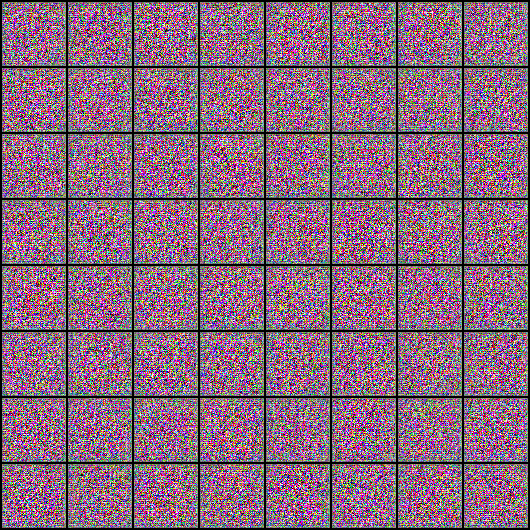

In [ ]:
Image('./generated/generated-images-0001.png')

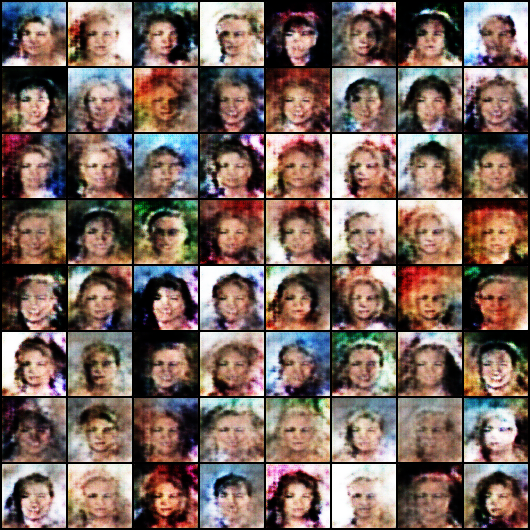

In [ ]:
Image('./generated/generated-images-0105.png')

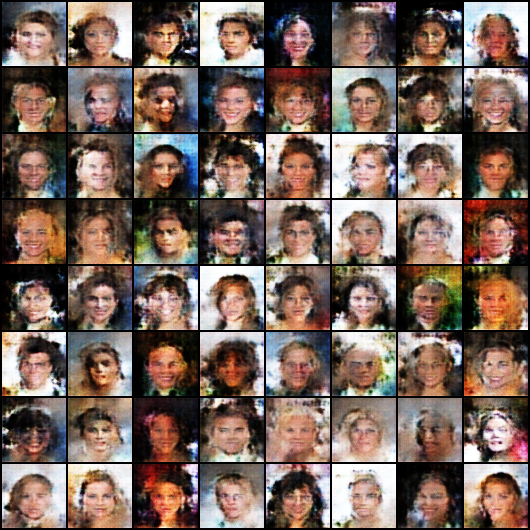

In [ ]:
Image('./generated/generated-images-0210.png')

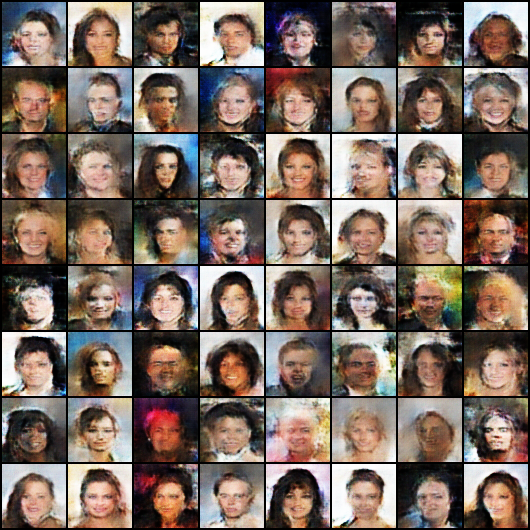

In [ ]:
Image('./generated/generated-images-0320.png')

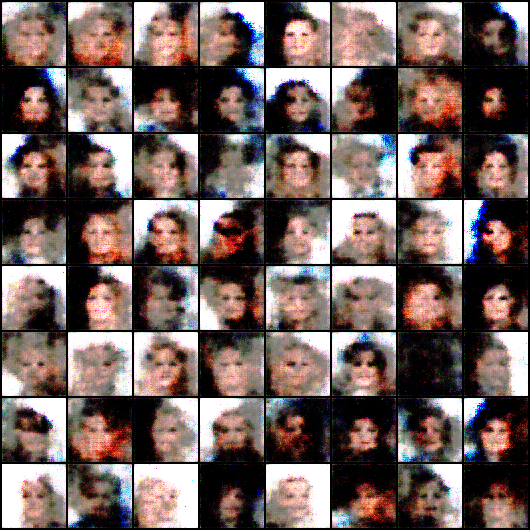

In [ ]:
Image('./generated/generated-images-0100.png')

In [ ]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

Text(0.5, 1.0, 'Losses')

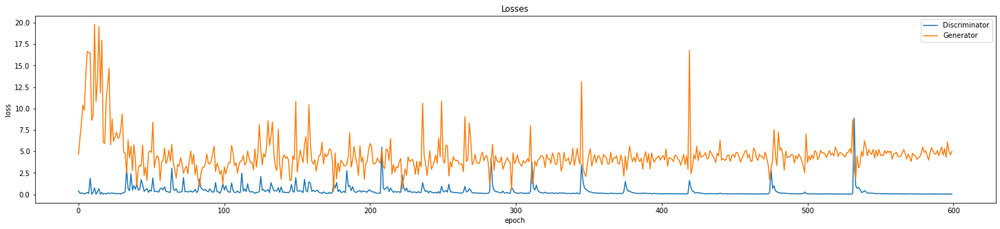

In [ ]:
plt.figure(figsize=(25,5))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses')

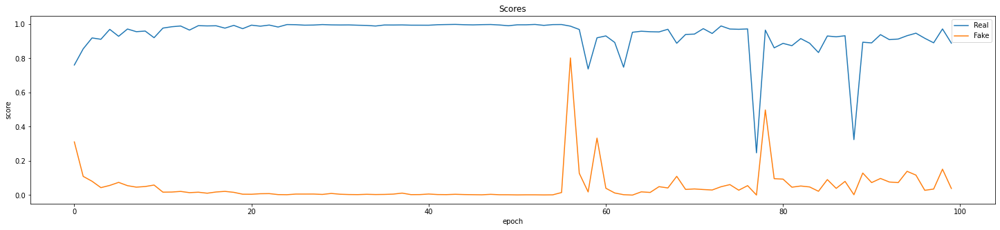

In [ ]:
plt.figure(figsize=(25,5))
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');